<a href="https://colab.research.google.com/github/faisal-iut/household-pulse/blob/master/education_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pmdarima

     |████████████████████████████████| 1.5MB 2.7MB/s 
     |████████████████████████████████| 8.7MB 13.3MB/s 
     |████████████████████████████████| 2.1MB 45.1MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
  Found existing installation: Cython 0.29.21
    Uninstalling Cython-0.29.21:
      Successfully uninstalled Cython-0.29.21


In [ ]:
from google.colab import drive

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import dill
import pickle
import re
import itertools
from statsmodels.tsa.arima_model import ARIMA
import statsmodels
print(statsmodels.__version__)
# import pmdarima as pm
# import warnings
# warnings.filterwarnings('ignore')

0.10.2


In [ ]:
from datetime import datetime, timedelta

# import all libraries and dependencies for data visualization
pd.options.display.float_format='{:.4f}'.format
plt.rcParams['figure.figsize'] = [8,8]
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', -1) 
sns.set(style='darkgrid')
import matplotlib.ticker as plticker
%matplotlib inline

# import all libraries and dependencies for machine learning
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
from math import isnan

# import all libraries and dependencies for clustering
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  import sys


In [ ]:
from google.colab import drive

In [ ]:
edu = {}
path =  '/content/drive/My Drive/Colab Notebooks/education data/'
w_s = 1
w_e = 10
t_s = 1
t_e = 5

In [ ]:
##Loading data
edu_3_ffile =  path+'edu_3_forecast.pickle'
with open(edu_3_ffile, 'rb') as handle:
    forecast = pickle.load(handle)

forecast[forecast < 0] = 0
forecast = forecast.drop('US', axis=0)
forecast.head(10)

,Total ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Total ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Total ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Total ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Total ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Total ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Total ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Total ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Total ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Total ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_40 - 5

In [ ]:
forecast.index

Index(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI',
       'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN',
       'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA',
       'WV', 'WI', 'WY', 'Boston_Metro_Area', 'Atlanta_Metro_Area',
       'Los.Angeles_Metro_Area', 'Phoenix_Metro_Area', 'New.York_Metro_Area',
       'San.Francisco_Metro_Area', 'Chicago_Metro_Area', 'Dallas_Metro_Area',
       'Riverside_Metro_Area', 'Detroit_Metro_Area', 'Houston_Metro_Area',
       'Washington.DC_Metro_Area', 'Philadelphia_Metro_Area',
       'Seattle_Metro_Area', 'Miami_Metro_Area'],
      dtype='object')

In [ ]:
strng = "Total"
cols = list(forecast.columns)

to_disc = []

for col in cols:
  if strng in col:
    to_disc.append(col)

forecast = forecast.drop(columns=to_disc)

In [ ]:
charect = ["Age", "Sex", "origin", "Education", "Marital", "Presence of children", 
             "Computer provided by…", "Internet provided by…", 
             "Respondent or household member experienced loss of employment",
           "Respondent currently employed", "Food sufficiency for households prior to March 13",
           "Household income"]

In [ ]:
cols = list(forecast.columns)
f_df = {}
for strng in charect:
  col_to_keep = [s for s in cols if strng in s]
  col_to_disc = list(set(cols).difference(set(col_to_keep)))
  f_df[strng] = forecast.drop(columns=col_to_disc) 
  df = f_df[strng]
  df[df < 0] = 0
  f_df[strng] = df

In [ ]:
f_df['Age']

,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Age_40 - 54 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_40 - 54 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes,Age_40 - 54 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_40 - 54 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Age_40 - 54 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Age_40 - 54 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Age_55 - 64 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,Age_55 - 64 ##FEATURE## Availability of computer for educational purposes - 

In [ ]:
df_null = df.isna().mean()*100
df_null

Household income_Less than $25,000 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes         0.0000
Household income_Less than $25,000 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes        0.0000
Household income_Less than $25,000 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes      0.0000
Household income_Less than $25,000 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes         0.0000
Household income_Less than $25,000 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes          0.0000
                                                                                                                                                             ...  
Household income_$200,

In [ ]:
ax_s = []
for i in range(0,6):
  for j in range(0,2):
    d = [i,j]
    ax_s.append(d)

(20.5, -0.5)

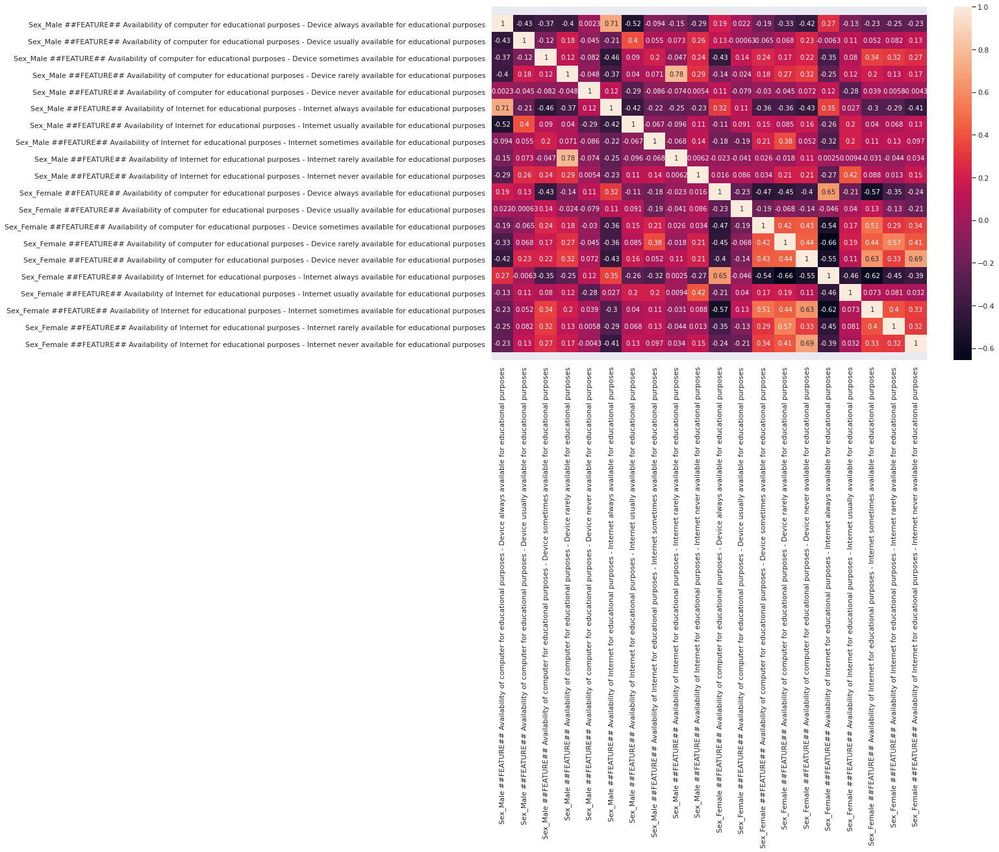

In [ ]:
# Heatmap to understand the attributes dependency

plt.figure(figsize = (15,10))        
ax = sns.heatmap(f_df[charect[1]].corr(),annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

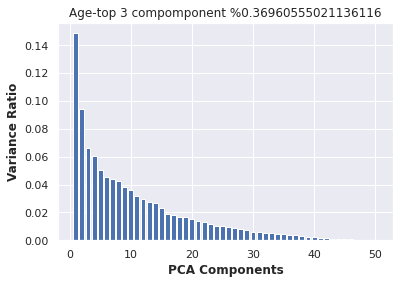

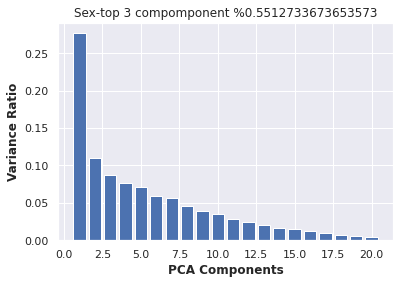

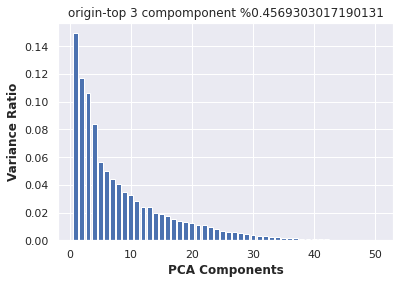

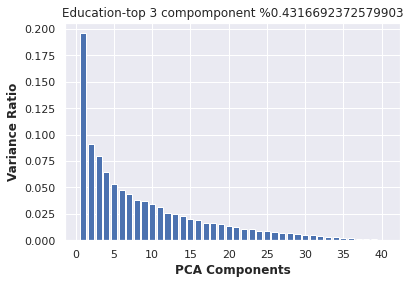

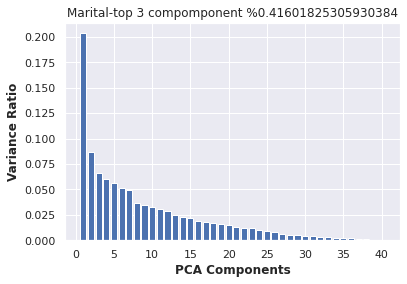

...

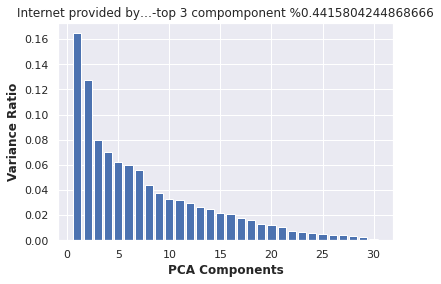

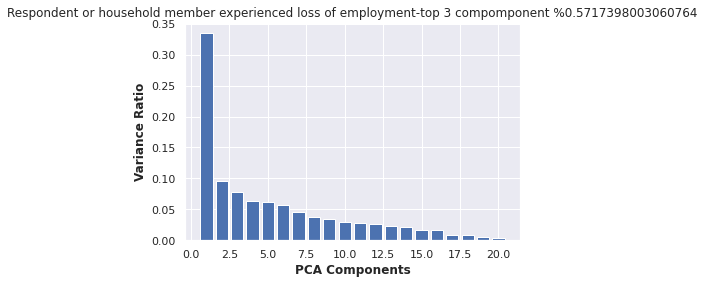

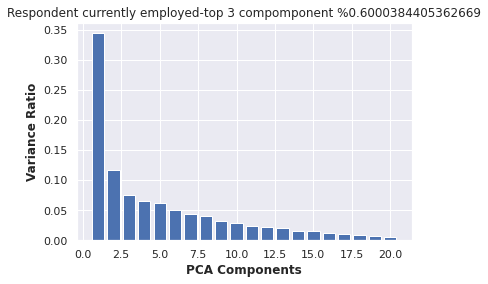

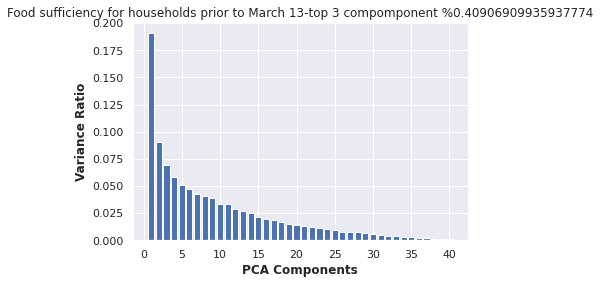

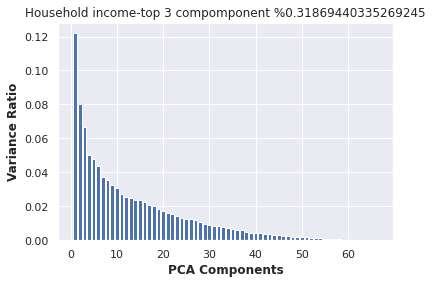

In [ ]:
pca={}
f_df_scaled = {}
for key,val in f_df.items():
  if key in charect:
    df = val
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)
    f_df_scaled[key] = df_scaled
    pca[key] = PCA(svd_solver='randomized', random_state=42)
    pca[key].fit(df_scaled)

    # Variance Ratio bar plot for each PCA components.
    plt.figure()
    ax = plt.bar(range(1,len(pca[key].explained_variance_ratio_)+1), pca[key].explained_variance_ratio_)
    plt.xlabel("PCA Components",fontweight = 'bold')
    plt.ylabel("Variance Ratio",fontweight = 'bold')
    plt.title(key+"-top 3 compomponent %"+str(np.cumsum(pca[key].explained_variance_ratio_)[3]))
    plt.show()

In [ ]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=16, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.8, xmax=70, xmin=0, colors="g", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')

AttributeError: ignored

<Figure size 864x576 with 0 Axes>

In [ ]:
# Checking which attributes are well explained by the pca components

pcs = {}
attributes_pca = {}
for key, val in f_df.items():
  df = val
  pcs[key] = {}
  for i in range(1,4):
    pcs[key]["PC_"+str(i)]= pca[key].components_[i]
  pcs[key]["Attribute"] = list(df.columns)
  attributes_pca[key] = pd.DataFrame(pcs[key])

In [ ]:
attributes_pca["Age"].head(10)

,PC_1,PC_2,PC_3,Attribute
0,-0.0551,0.0992,-0.0899,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes
1,0.0030,0.1102,-0.0566,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes
2,-0.0192,0.2299,-0.0247,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes
3,0.2440,0.2726,-0.0094,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes
4,0.2050,0.2834,-0.0950,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes
5,0.2442,-0.0903,-0.0179,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes
6,0.2103,-0.0865,0.0942,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes
7,0.3877,0.0649,-0.0240,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes
8,0.2605,0.2680,0.0502,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes
9,0.3944,0.0099,0.0129,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes


################################################
Age


<Figure size 360x360 with 0 Axes>

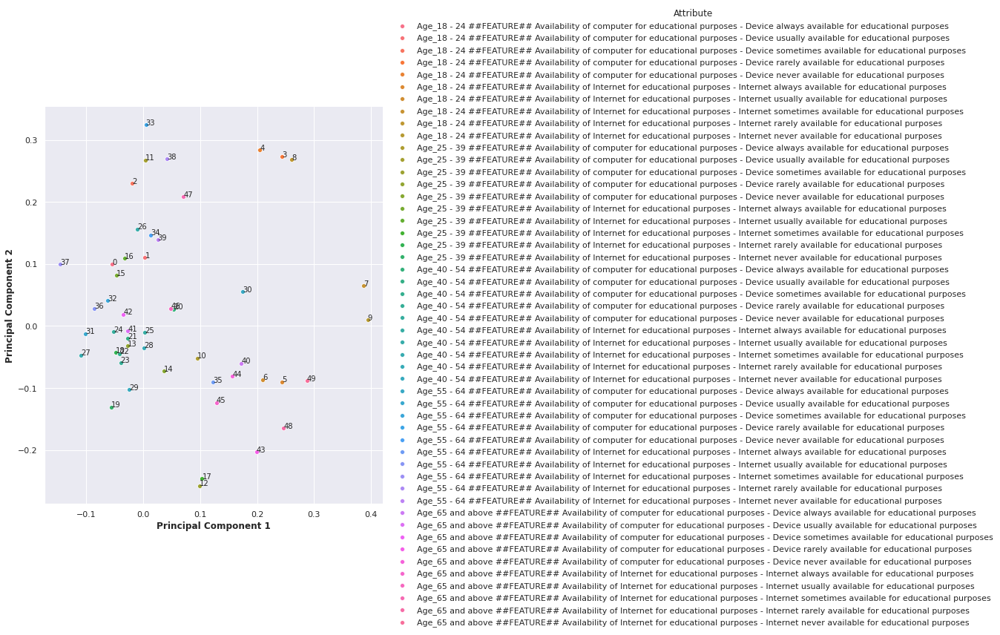

<Figure size 360x360 with 0 Axes>

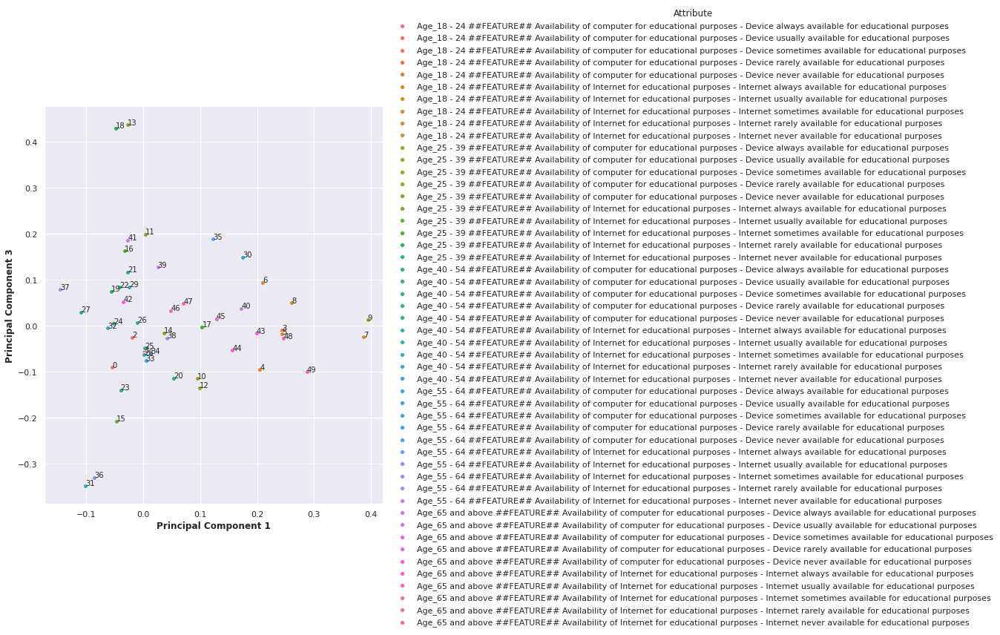

################################################
################################################
Sex


<Figure size 360x360 with 0 Axes>

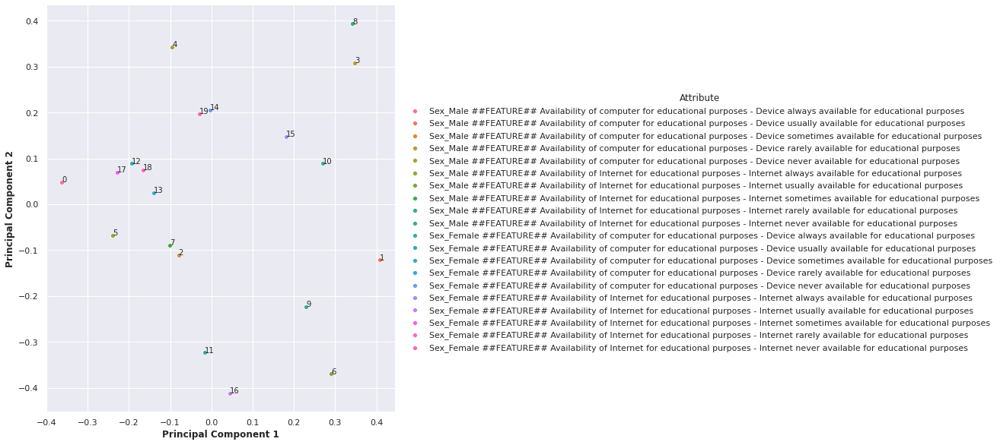

<Figure size 360x360 with 0 Axes>

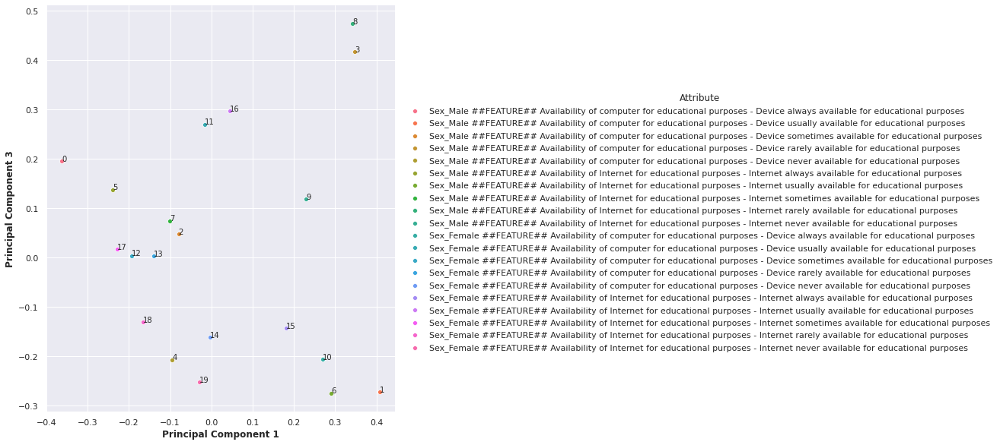

################################################
################################################
origin


<Figure size 360x360 with 0 Axes>

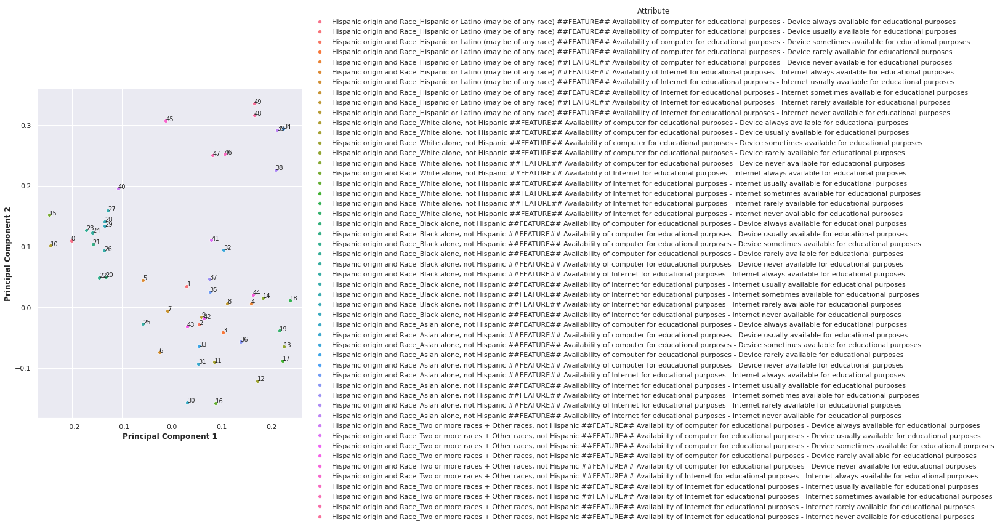

<Figure size 360x360 with 0 Axes>

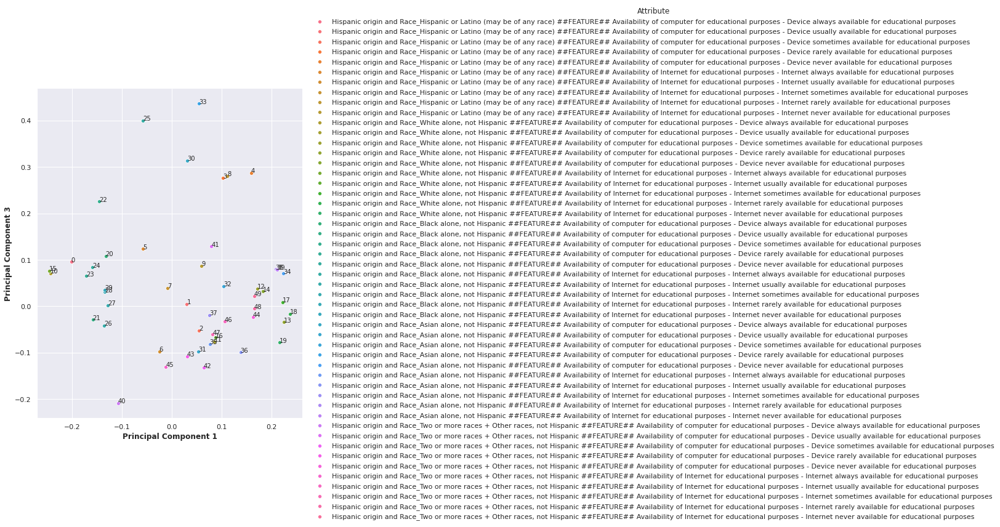

################################################
################################################
Education


<Figure size 360x360 with 0 Axes>

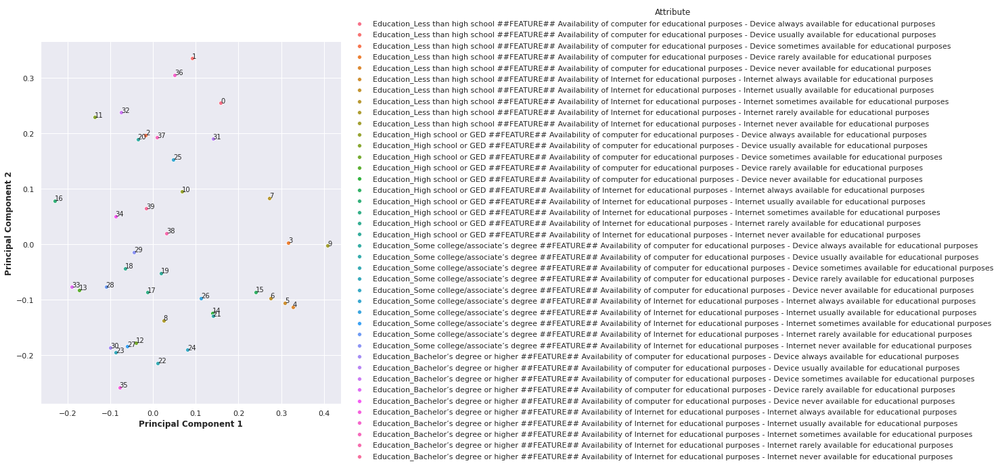

<Figure size 360x360 with 0 Axes>

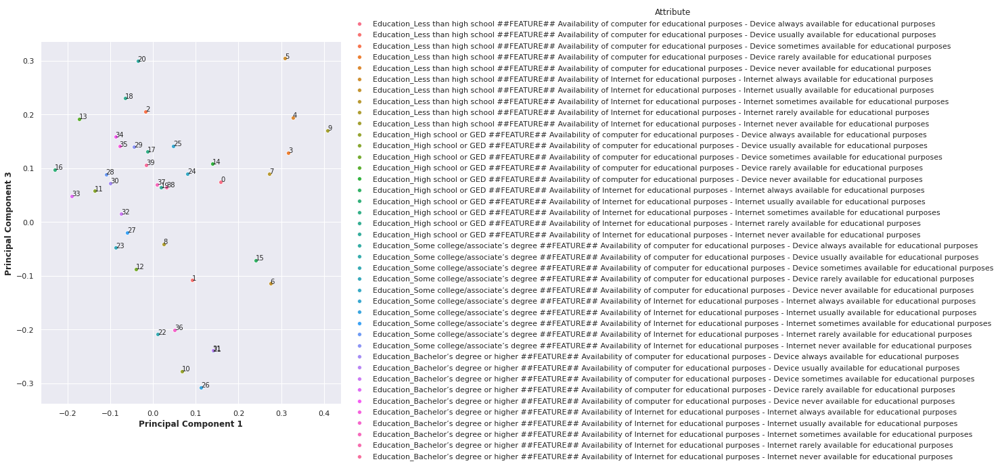

################################################
################################################
Marital


<Figure size 360x360 with 0 Axes>

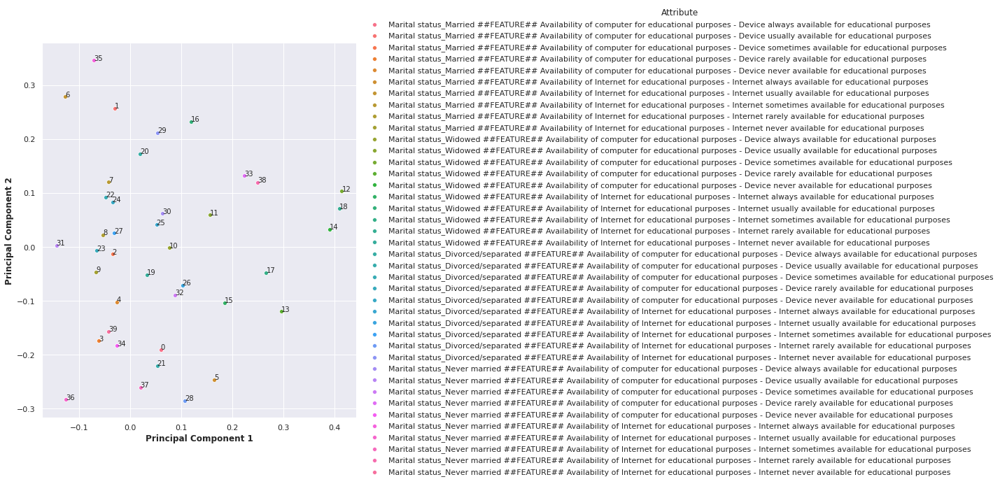

<Figure size 360x360 with 0 Axes>

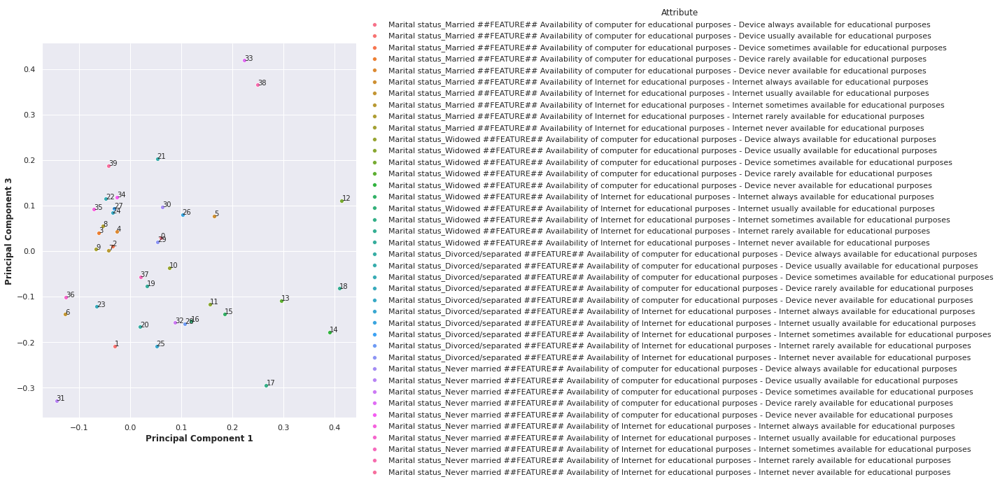

################################################
################################################
Presence of children


<Figure size 360x360 with 0 Axes>

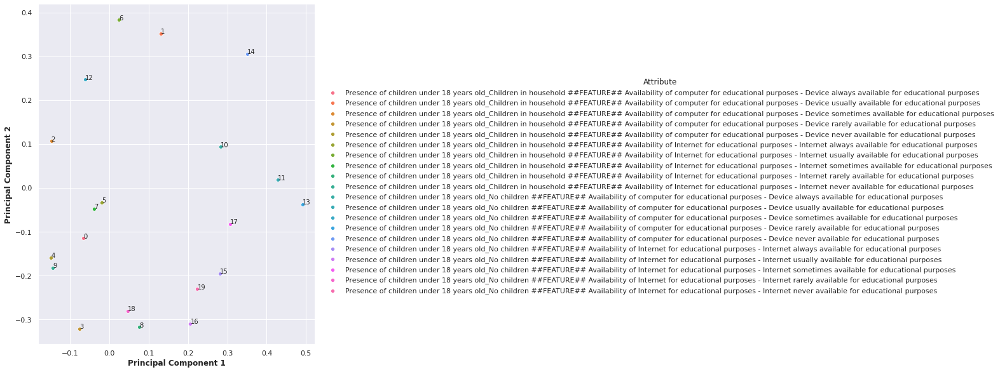

<Figure size 360x360 with 0 Axes>

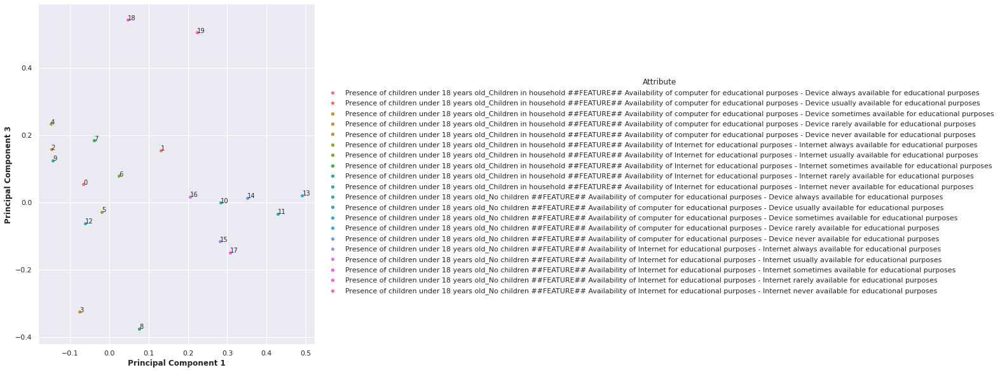

################################################
################################################
Computer provided by…


<Figure size 360x360 with 0 Axes>

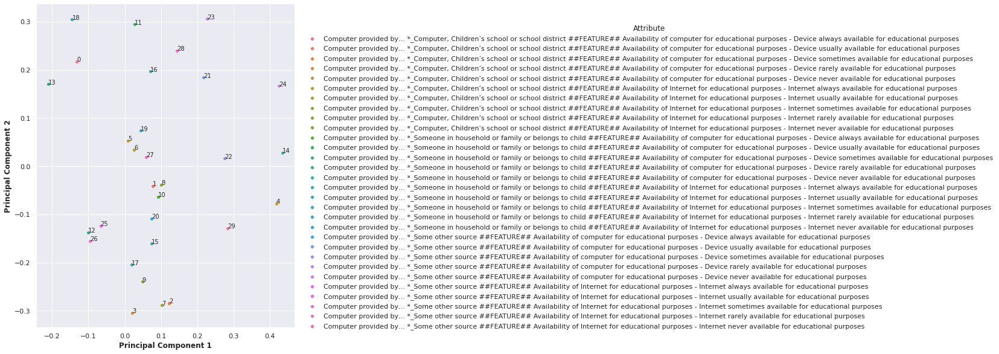

<Figure size 360x360 with 0 Axes>

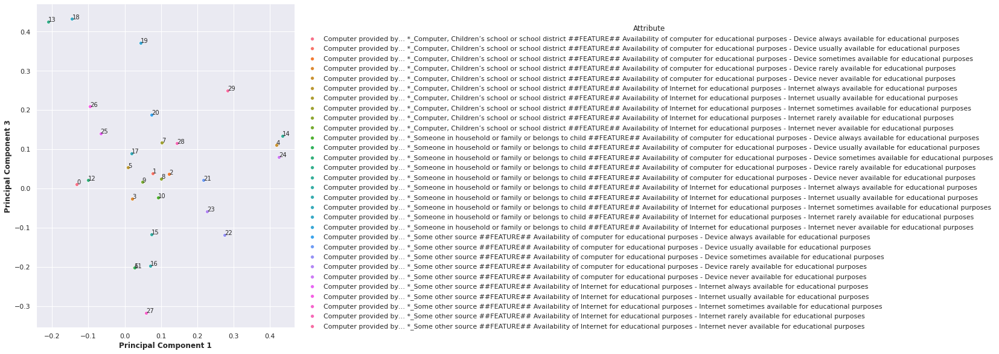

################################################
################################################
Internet provided by…


<Figure size 360x360 with 0 Axes>

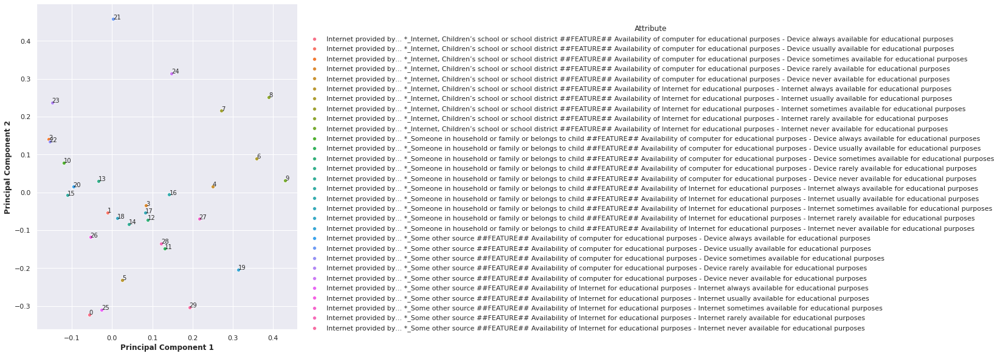

<Figure size 360x360 with 0 Axes>

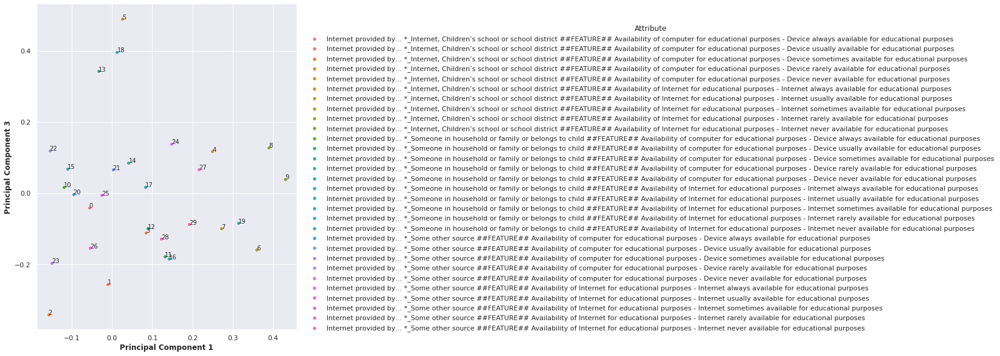

################################################
################################################
Respondent or household member experienced loss of employment


<Figure size 360x360 with 0 Axes>

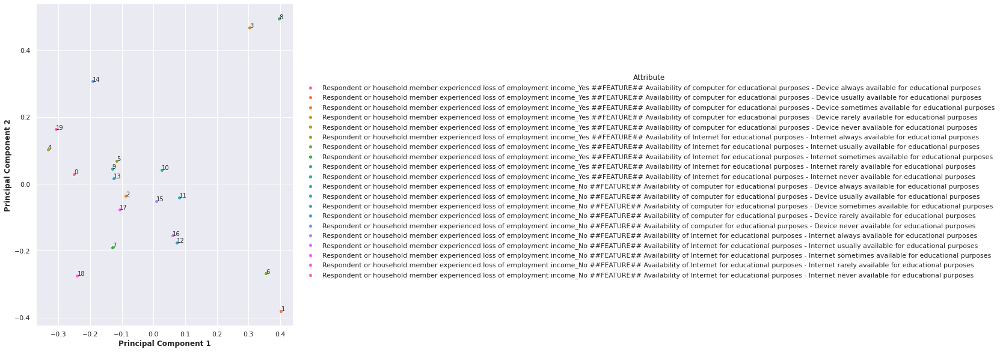

<Figure size 360x360 with 0 Axes>

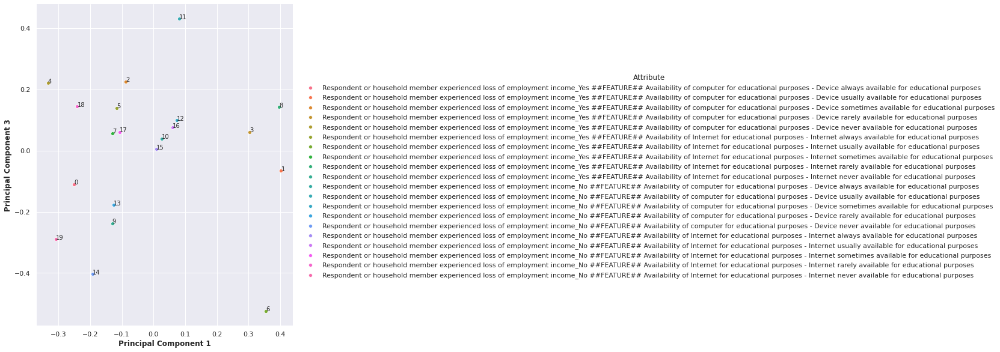

################################################
################################################
Respondent currently employed


<Figure size 360x360 with 0 Axes>

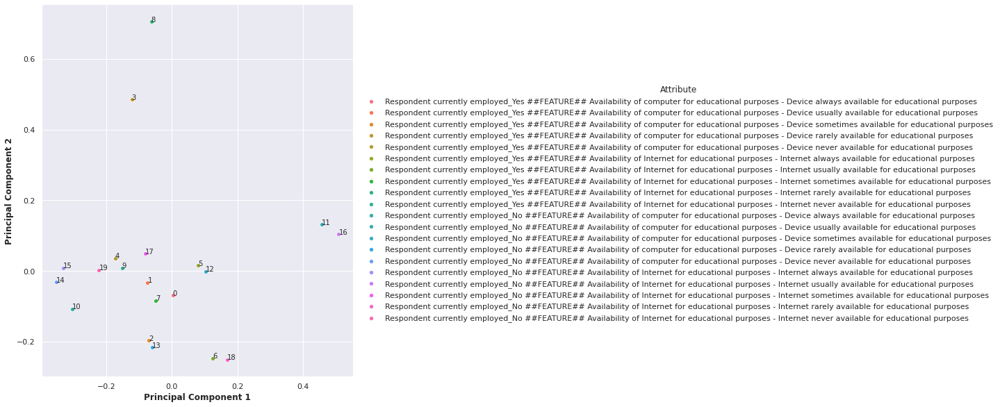

<Figure size 360x360 with 0 Axes>

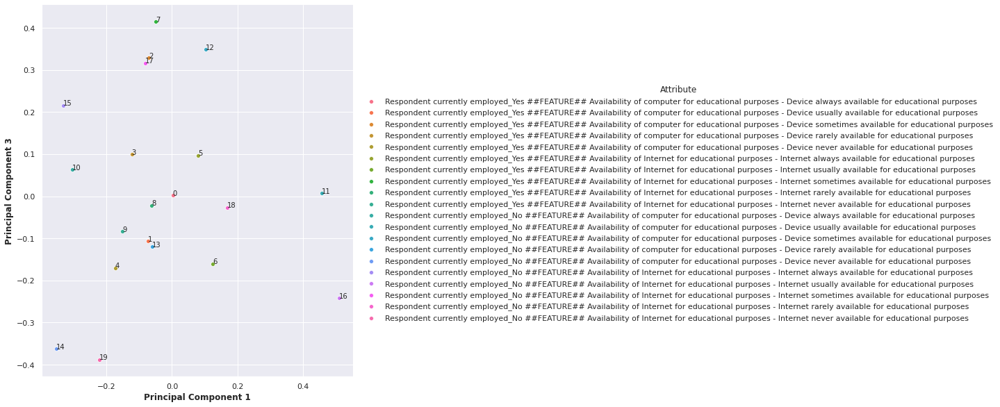

################################################
################################################
Food sufficiency for households prior to March 13


<Figure size 360x360 with 0 Axes>

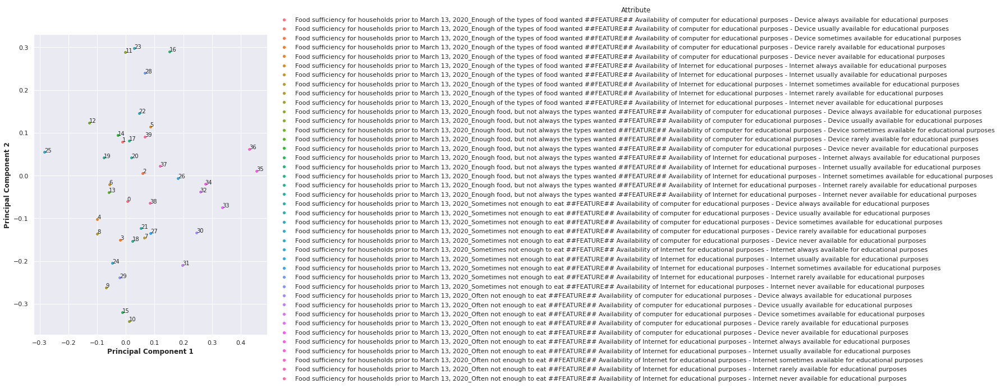

<Figure size 360x360 with 0 Axes>

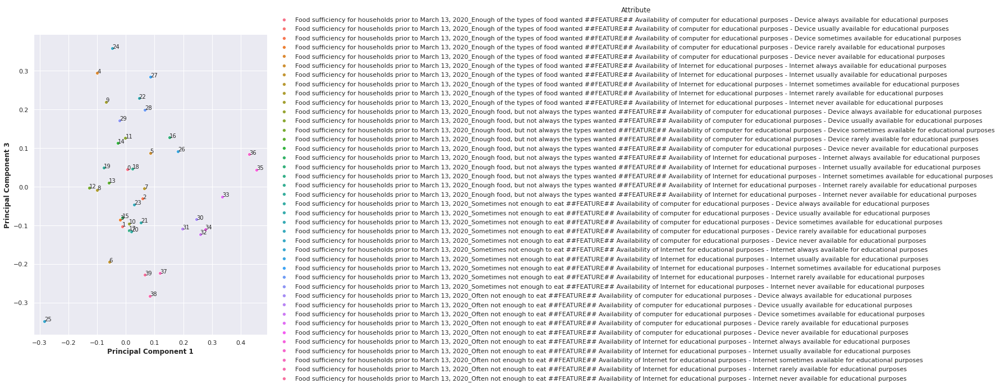

################################################
################################################
Household income


<Figure size 360x360 with 0 Axes>

KeyboardInterrupt: ignored

In [ ]:
# Plotting the above dataframe for better visualization with PC1 and PC2

for key, val in attributes_pca.items():
  print("################################################")
  print(key)
  plt.figure(figsize=(5,5))
  sns.pairplot(data=attributes_pca[key], x_vars=["PC_1"], y_vars=["PC_2"], hue = "Attribute" ,height=8)
  plt.xlabel("Principal Component 1",fontweight = 'bold')
  plt.ylabel("Principal Component 2",fontweight = 'bold')
  for i,txt in enumerate(attributes_pca[key].Attribute):
      plt.annotate(str(i), (attributes_pca[key].PC_1[i],attributes_pca[key].PC_2[i]))
  plt.show()

  plt.figure(figsize=(5,5))
  sns.pairplot(data=attributes_pca[key], x_vars=["PC_1"], y_vars=["PC_3"], hue = "Attribute" ,height=8)
  plt.xlabel("Principal Component 1",fontweight = 'bold')
  plt.ylabel("Principal Component 3",fontweight = 'bold')
  for i,txt in enumerate(attributes_pca[key].Attribute):
      plt.annotate(str(i), (attributes_pca[key].PC_1[i],attributes_pca[key].PC_3[i]))
  plt.show()
  print("################################################")

In [ ]:
for key, val in f_df.items():
  df = val
  for i in range(1,4):
    attributes_pca[key]["PC_R_"+str(i)]= attributes_pca[key]["PC_"+str(i)].rank(pct=True)
attributes_pca["Age"].head()

,PC_1,PC_2,PC_3,Attribute,PC_R_1,PC_R_2,PC_R_3
0,-0.0551,0.0992,-0.0899,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,0.1400,0.7200,0.2000
1,0.0030,0.1102,-0.0566,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,0.4600,0.7800,0.2800
2,-0.0192,0.2299,-0.0247,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes,0.3800,0.8800,0.3800
3,0.2440,0.2726,-0.0094,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,0.8800,0.9600,0.4800
4,0.2050,0.2834,-0.0950,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,0.8400,0.9800,0.1800


In [ ]:
imp_subchar = set()
for key, val in f_df.items():
  df = val
  print(key)
  for i in range(1,4):
    k1 = "PC_R_"+str(i)
    char_list = list(attributes_pca[key][attributes_pca[key][k1]>=0.95].Attribute)
    print("PCA",i,":",char_list)
    imp_subchar.update(char_list)
  print()

Age
PCA 1 : ['Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes', 'Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes', 'Age_65 and above ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes']
PCA 2 : ['Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes', 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes', 'Age_55 - 64 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes']
PCA 3 : ['Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes', 'Age_25 - 39 ##FEATURE## Availability of computer for educati

In [ ]:
imp_subchar

{'Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes',
 'Age_55 - 64 ##FEATURE## Availability of computer for educational purposes - Device rare

In [ ]:
forecast_f = forecast.filter(list(imp_subchar), axis=1)

In [ ]:
forecast_f.head()

,Presence of children under 18 years old_No children ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,"Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Respondent currently employed_Yes ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,"Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes","Household income_$100,000 - $149,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Sex_Male ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Sex_Male ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Education_Bachelor’s degree or higher ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,"Internet provided by… *_Internet, Children’s school or school district ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Marital status_Married ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,"Food sufficiency for households prior to March 13, 2020_Enough food, but not always the types wanted ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes",Sex_Male ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,"Household income_$150,000 - $199,999 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes","Internet provided by… *_Internet, Children’s school or school district ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes","Hispanic origin and Race_White alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes","Food sufficiency for households prior to March 13, 2020_Sometimes not enough to eat ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes",Education_Some college/associate’s degree ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,"Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes","Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",Education_Less than high school ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,"Household income_$200,000 and above ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes","Household income_$50,000 - $74,999 ##FEATURE## Availability of computer for educational pu

In [ ]:
df = forecast_f
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)
pca = PCA(svd_solver='randomized', random_state=42)
pca.fit(df_scaled)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

Text(0, 0.5, 'Variance Ratio')

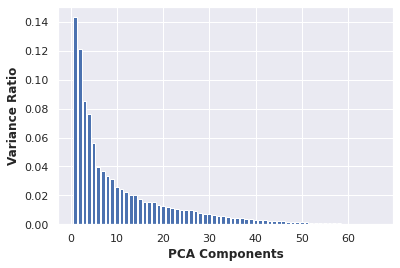

In [ ]:
# Variance Ratio bar plot for each PCA components.

ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

Text(0, 0.5, 'Cumulative Explained Variance')

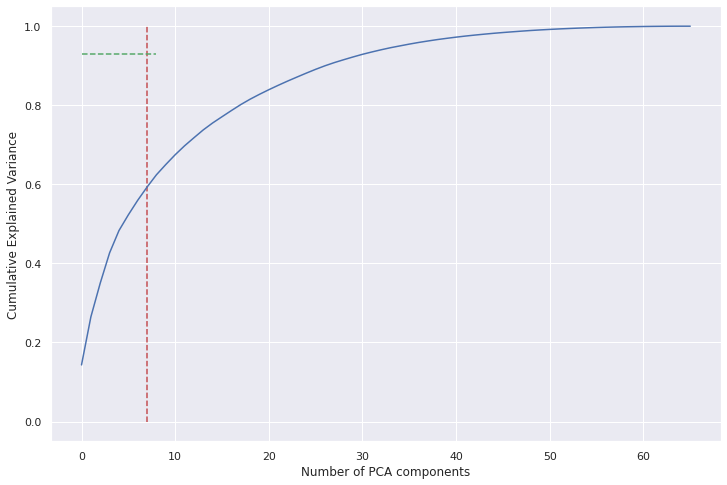

In [ ]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=7, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.93, xmax=8, xmin=0, colors="g", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')

In [ ]:
org_col = list(df.columns)
Attributes_pca = pd.DataFrame({'Attribute':org_col,
                               'PC_1':pca.components_[0],'PC_2':pca.components_[1],'PC_3':pca.components_[2]})
Attributes_pca.head()

,Attribute,PC_1,PC_2,PC_3
0,Presence of children under 18 years old_No children ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,-0.0185,0.0868,0.2055
1,"Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",0.0263,-0.0368,-0.0204
2,Respondent currently employed_Yes ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,0.0385,0.0336,-0.0775
3,Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,-0.1054,0.1998,0.1275
4,"Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",-0.1392,0.1986,0.0233


################################################


<Figure size 360x360 with 0 Axes>

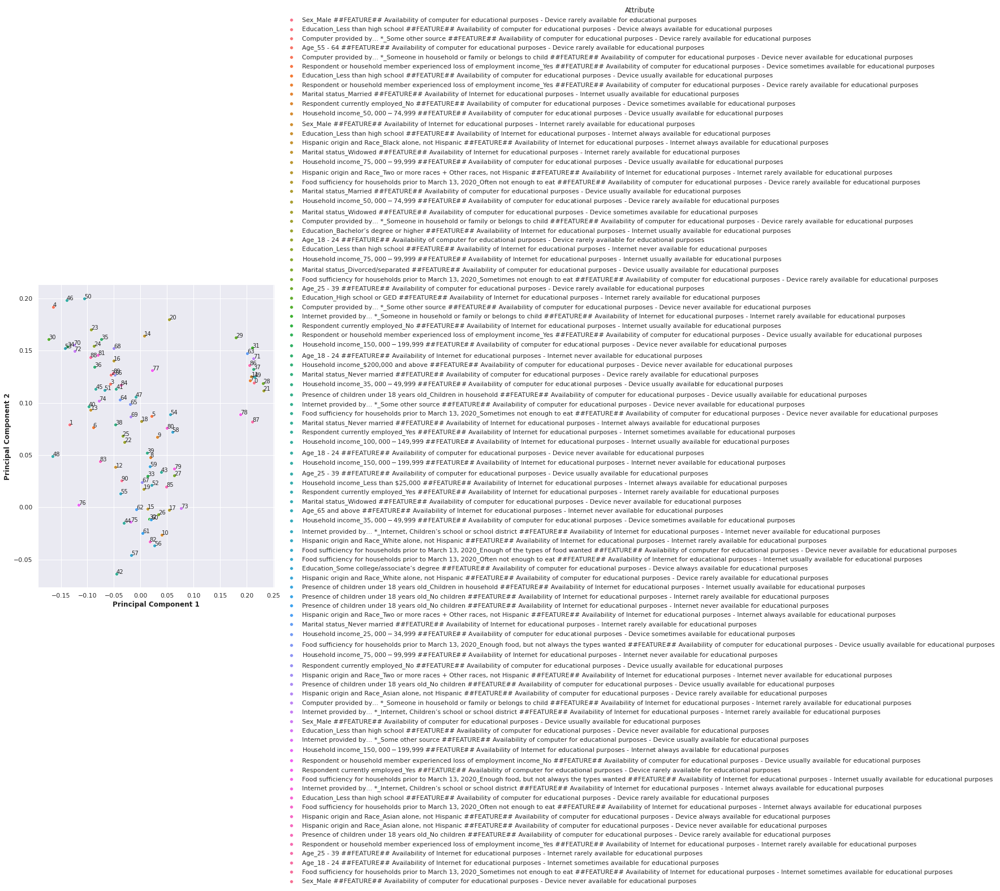

<Figure size 360x360 with 0 Axes>

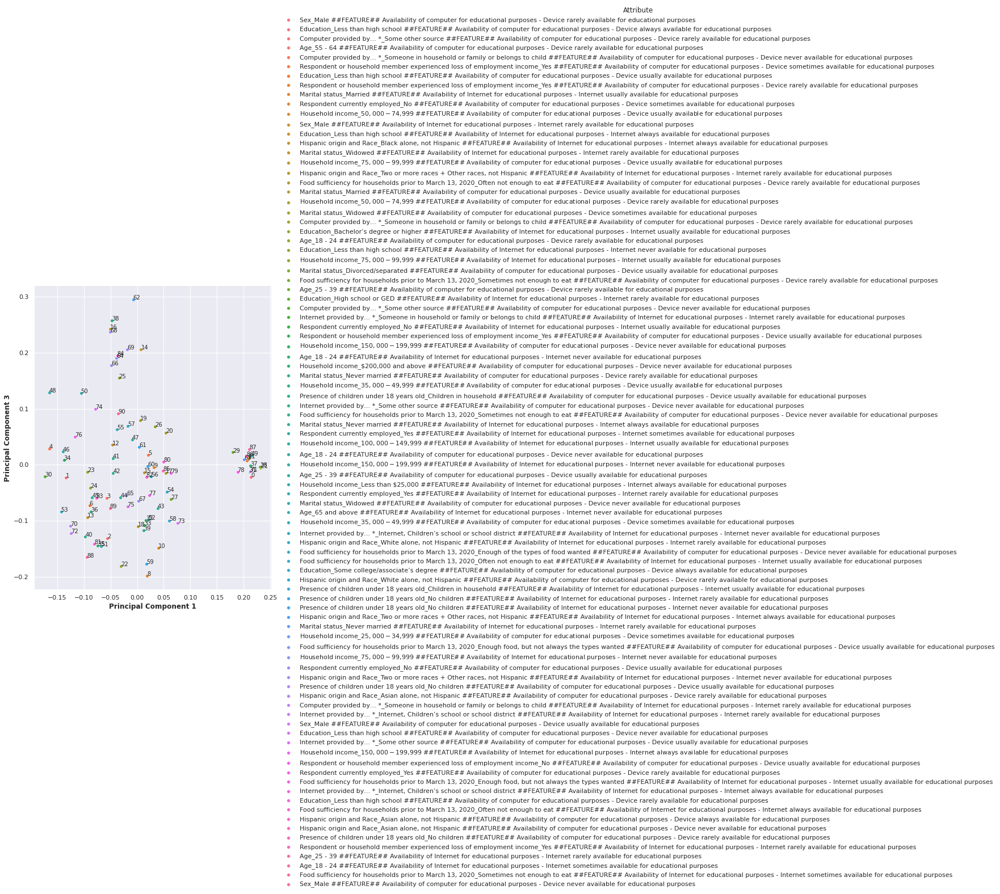

################################################


In [ ]:
print("################################################")
plt.figure(figsize=(5,5))
sns.pairplot(data=Attributes_pca, x_vars=["PC_1"], y_vars=["PC_2"], hue = "Attribute" ,height=8)
plt.xlabel("Principal Component 1",fontweight = 'bold')
plt.ylabel("Principal Component 2",fontweight = 'bold')
for i,txt in enumerate(Attributes_pca.Attribute):
    plt.annotate(str(i), (Attributes_pca.PC_1[i],Attributes_pca.PC_2[i]))
plt.show()

plt.figure(figsize=(5,5))
sns.pairplot(data=Attributes_pca, x_vars=["PC_1"], y_vars=["PC_3"], hue = "Attribute" ,height=8)
plt.xlabel("Principal Component 1",fontweight = 'bold')
plt.ylabel("Principal Component 3",fontweight = 'bold')
for i,txt in enumerate(Attributes_pca.Attribute):
    plt.annotate(str(i), (Attributes_pca.PC_1[i],Attributes_pca.PC_3[i]))
plt.show()
print("################################################")

In [ ]:
for i in range(1,4):
    Attributes_pca["PC_R_"+str(i)]= Attributes_pca["PC_"+str(i)].rank(pct=True)
Attributes_pca.head()

,Attribute,PC_1,PC_2,PC_3,PC_R_1,PC_R_2,PC_R_3
0,Presence of children under 18 years old_No children ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,-0.0185,0.0868,0.2055,0.4725,0.4725,0.9451
1,"Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",0.0263,-0.0368,-0.0204,0.7033,0.0330,0.4505
2,Respondent currently employed_Yes ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,0.0385,0.0336,-0.0775,0.7363,0.2747,0.2637
3,Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,-0.1054,0.1998,0.1275,0.1209,1.0000,0.8791
4,"Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",-0.1392,0.1986,0.0233,0.0549,0.9890,0.7253


In [ ]:
  imp_feat = set()
  for i in range(1,4):
    k1 = "PC_R_"+str(i)
    char_list = list(Attributes_pca[Attributes_pca[k1]>=0.90].Attribute)
    print("PCA",i,":",char_list)
    imp_feat.update(char_list)
  print()

PCA 1 : ['Sex_Male ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes', 'Sex_Male ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes', 'Respondent or household member experienced loss of employment income_Yes ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes', 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes', 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes', 'Marital status_Never married ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes', 'Respondent currently employed_Yes ##FEATURE## Availability of Internet for educatio

In [ ]:
imp_feat

{'Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Computer provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational

In [ ]:
 # Building the dataframe using Incremental PCA for better efficiency.

inc_pca = IncrementalPCA(n_components=3)

In [ ]:
# Fitting the scaled df on incremental pca

df_inc_pca = inc_pca.fit_transform(df_scaled)

In [ ]:
# Creating new dataframe with Principal components
column = []
for i in range(1,4):
  column.append("PC_"+str(i))
df_pca = pd.DataFrame(df_inc_pca, columns=column)
locs = pd.DataFrame(list(df.index),columns = ["Location"])
df_pca_final = pd.concat([locs, df_pca], axis=1)
df_pca_final.head()

,Location,PC_1,PC_2,PC_3
0,AL,2.4074,0.9151,-0.2216
1,AK,-3.0180,5.4917,0.8974
2,AZ,0.3841,1.0745,-0.5373
3,AR,2.7487,1.8797,-1.6792
4,CA,0.1092,-2.3704,0.1443


(3.5, -0.5)

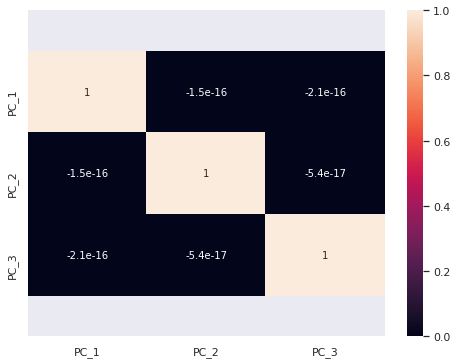

In [ ]:
# Plotting Heatmap to check is there still dependency in the dataset.

plt.figure(figsize = (8,6))        
ax = sns.heatmap(df_pca_final.corr(),annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

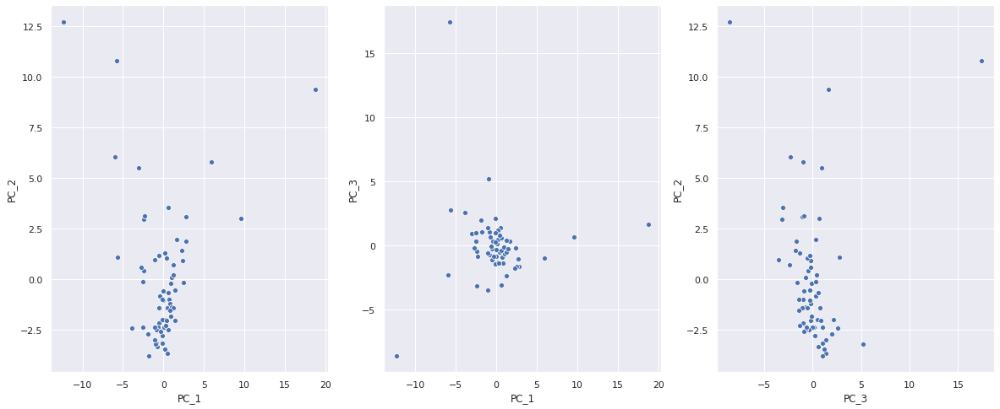

In [ ]:
# Scatter Plot to visualize the spread of data across PCA components

plt.figure(figsize=(20, 8))
plt.subplot(1,3,1)
sns.scatterplot(data=df_pca_final, x='PC_1', y='PC_2')
plt.subplot(1,3,2)
sns.scatterplot(data=df_pca_final, x='PC_1', y='PC_3')
plt.subplot(1,3,3)
sns.scatterplot(data=df_pca_final, x='PC_3', y='PC_2')

In [ ]:
# Reindexing the df 
df_pca_final = df_pca_final.reset_index(drop=True)
df_pca_final_data = df_pca_final.drop(['Location'],axis=1)
df_pca_final.head()

,Location,PC_1,PC_2,PC_3
0,AL,2.4074,0.9151,-0.2216
1,AK,-3.0180,5.4917,0.8974
2,AZ,0.3841,1.0745,-0.5373
3,AR,2.7487,1.8797,-1.6792
4,CA,0.1092,-2.3704,0.1443


In [ ]:
# Calculating Hopkins score to know whether the data is good for clustering or not.

def hopkins(X):
    d = X.shape[1]
    n = len(X)
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    HS = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(HS):
        print(ujd, wjd)
        HS = 0
 
    return HS


In [ ]:
hopkins(df_pca_final_data)

0.901335470232021

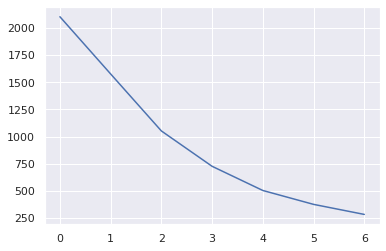

In [ ]:
# Elbow curve method to find the ideal number of clusters.
ssd = []
for num_clusters in list(range(1,8)):
    model_clus = KMeans(n_clusters = num_clusters, max_iter=50,random_state= 100)
    model_clus.fit(df_pca_final_data)
    ssd.append(model_clus.inertia_)

plt.plot(ssd)

In [ ]:
# Silhouette score analysis to find the ideal number of clusters for K-means clustering

range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50,random_state= 100)
    kmeans.fit(df_pca_final_data)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(df_pca_final_data, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.643190094555988
For n_clusters=3, the silhouette score is 0.6353164174628542
For n_clusters=4, the silhouette score is 0.6684975708114174
For n_clusters=5, the silhouette score is 0.37214050068049026
For n_clusters=6, the silhouette score is 0.3845417653124603
For n_clusters=7, the silhouette score is 0.3285077516623654
For n_clusters=8, the silhouette score is 0.3125032981683176


In [ ]:
#K-means with k=4 clusters

cluster5 = KMeans(n_clusters=5, max_iter=50, random_state= 100)
cluster5.fit(df_pca_final_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=50,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=100, tol=0.0001, verbose=0)

In [ ]:
# Cluster labels

cluster5.labels_

array([0, 0, 0, 0, 1, 1, 1, 0, 3, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 2, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 2, 1, 1, 0, 1, 1,
       1, 4, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1],
      dtype=int32)

In [ ]:
# Assign the label

df_pca_final['Cluster_Id5'] = cluster5.labels_
df_pca_final.head()

,Location,PC_1,PC_2,PC_3,Cluster_Id5
0,AL,2.4074,0.9151,-0.2216,0
1,AK,-3.0180,5.4917,0.8974,0
2,AZ,0.3841,1.0745,-0.5373,0
3,AR,2.7487,1.8797,-1.6792,0
4,CA,0.1092,-2.3704,0.1443,1


In [ ]:
# Number of countries in each cluster

df_pca_final['Cluster_Id5'].value_counts()

1    42
0    19
2    3 
4    1 
3    1 
Name: Cluster_Id5, dtype: int64

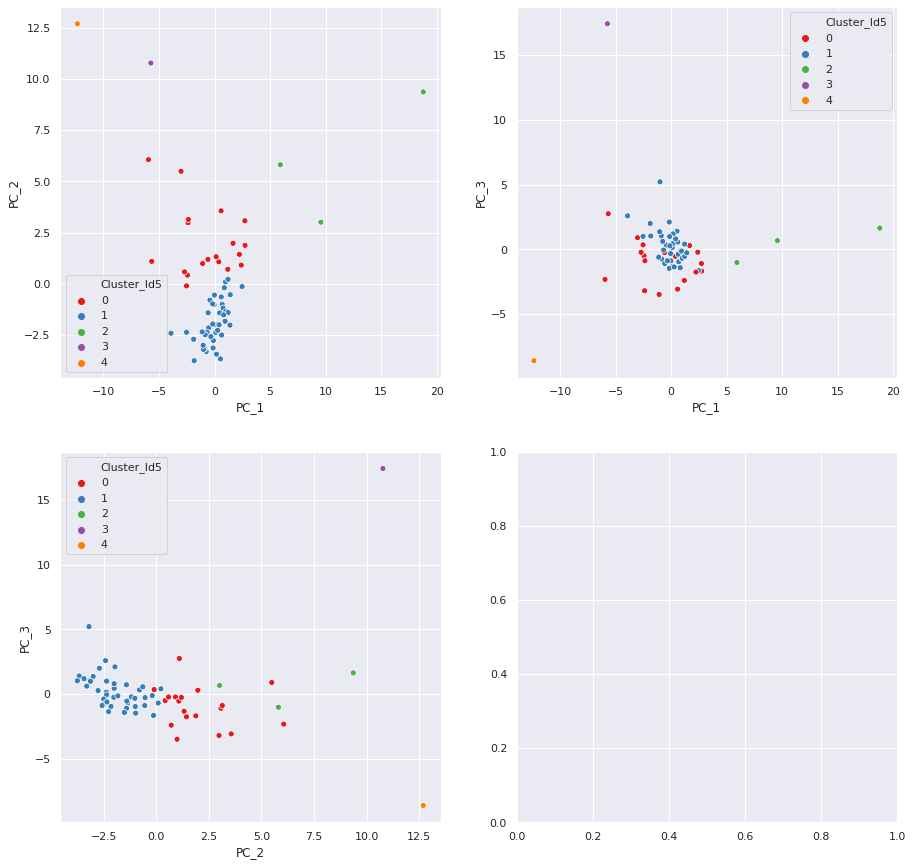

In [ ]:
# Scatter plot on Principal components to visualize the spread of the data

fig, axes = plt.subplots(2,2, figsize=(15,15))

sns.scatterplot(x='PC_1',y='PC_2',hue='Cluster_Id5',legend='full',palette="Set1",data=df_pca_final,ax=axes[0][0])
sns.scatterplot(x='PC_1',y='PC_3',hue='Cluster_Id5',legend='full',palette="Set1",data=df_pca_final,ax=axes[0][1])
sns.scatterplot(x='PC_2',y='PC_3',hue='Cluster_Id5',legend='full',palette="Set1",data=df_pca_final,ax=axes[1][0])

In [ ]:
df_locs = df.copy()
df_locs["Location"] = df.index
df_locs = df_locs.reset_index(drop=True)
df_locs.head(10)

,Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Marital status_Widowed ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,"Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Education_Some college/associate’s degree ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,"Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,"Food sufficiency for households prior to March 13, 2020_Enough food, but not always the types wanted ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Respondent or household member experienced loss of employment income_No ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Internet provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,"Household income_$50,000 - $74,999 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes","Food sufficiency for households prior to March 13, 2020_Sometimes not enough to eat ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes","Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes",Marital status_Never married ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Education_Bachelor’s degree or higher ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,Internet provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Respondent currently employed_No ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,"Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes","Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device rarely available for educatio

In [ ]:
df_merge = pd.merge(df_locs,df_pca_final,on='Location')

In [ ]:
df_merge_col = list(df_merge.columns)
df_merge_col

cluster_mean={}
for colm in df_merge_col[0:91]:
  cluster_mean["cluster_"+colm] = list(df_merge.groupby(["Cluster_Id5"])[colm].mean().values)
df_mean_cl = pd.DataFrame(cluster_mean)
df_mean_cl["Cluster id"] = df_mean_cl.index

In [ ]:
df_merge_wopc = df_merge.drop(columns=df_merge_col[92:95])

In [ ]:
df_mean_cl

,cluster_Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,cluster_Marital status_Widowed ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,"cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",cluster_Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,cluster_Education_Some college/associate’s degree ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,"cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",cluster_Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device always available for educational purposes,"cluster_Food sufficiency for households prior to March 13, 2020_Enough food, but not always the types wanted ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",cluster_Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,cluster_Respondent or household member experienced loss of employment income_No ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,cluster_Internet provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,"cluster_Household income_$50,000 - $74,999 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes","cluster_Food sufficiency for households prior to March 13, 2020_Sometimes not enough to eat ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes","cluster_Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes",cluster_Marital status_Never married ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,cluster_Education_Bachelor’s degree or higher ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,cluster_Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet sometimes available for educational purposes,cluster_Internet provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,cluster_Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,cluster_Respondent currently employed_No ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,"cluster_Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes","cluster_Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",cluster_Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,cluster_Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device never available for educ

In [ ]:
imp_feat_f = ['Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Computer provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Education_High school or GED ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes',
 'Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes',
 'Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes',
 'Internet provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Marital status_Never married ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes',
 'Presence of children under 18 years old_No children ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes',
 'Respondent currently employed_Yes ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Respondent or household member experienced loss of employment income_Yes ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Sex_Male ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Sex_Male ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes']

In [ ]:
imp_feat_f_marital = ['Marital status_Never married ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes']


In [ ]:
imp_feat_f_household = ['Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes',
 'Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes',
 'Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes',
]

In [ ]:
imp_feat_f_age = ['Age_18 - 24 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Age_18 - 24 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Age_25 - 39 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes'
]

In [ ]:
imp_feat_f_origin = ['Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes',
 'Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes']


In [ ]:
imp_feat_f_source = ['Computer provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes',
 'Computer provided by… *_Someone in household or family or belongs to child ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes']


In [ ]:
df_mean_cl["cluster_"+imp_feat_f_household[0]]

0   0.0971
1   0.0097
2   0.0043
3   0.3321
4   0.2909
Name: cluster_Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes, dtype: float64

In [ ]:
ll={}
for feat in imp_feat_f_household:
  ll["cluster_"+feat]=""
ll

{'cluster_Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes': '',
 'cluster_Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes': '',
 'cluster_Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes': '',
 'cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes': '',
 'cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes': ''}

In [ ]:
ll = {'cluster_Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes': '',
 'cluster_Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes': '25k-35k-computer-sometimes',
 'cluster_Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes': '35k-50k-computer-usually',
 'cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes': '75k-99k-internet-never',
 'cluster_Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes': '75k-99k-internet-usually'}

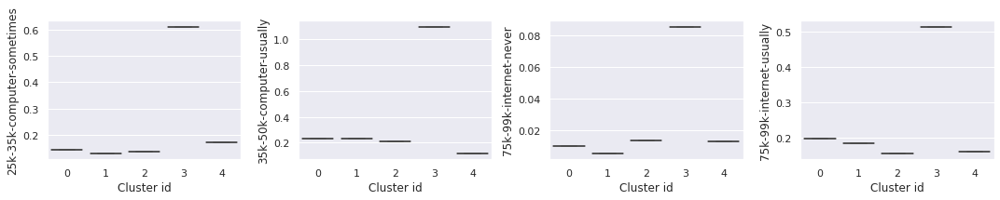

In [ ]:
# Box plot to visualise the mean value of few original attributes.

count = 0
fig, axes = plt.subplots(1,4, figsize=(15,3))
for feat in imp_feat_f_household[1:]:
  sns.boxplot(data = df_mean_cl, x = 'Cluster id', y = "cluster_"+feat,ax = axes[count] )
  axes[count].set_ylabel(ll["cluster_"+feat])
  count = count+1
plt.tight_layout()
plt.show()

###Hierarchical Clustering

In [ ]:
df_pca_final_data.head()

,PC_1,PC_2,PC_3
0,2.4074,0.9151,-0.2216
1,-3.0180,5.4917,0.8974
2,0.3841,1.0745,-0.5373
3,2.7487,1.8797,-1.6792
4,0.1092,-2.3704,0.1443


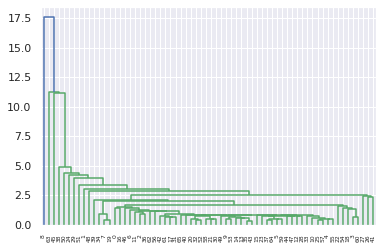

In [ ]:
# Single linkage

mergings = linkage(df_pca_final_data, method='single',metric='euclidean')
dendrogram(mergings)
plt.show()

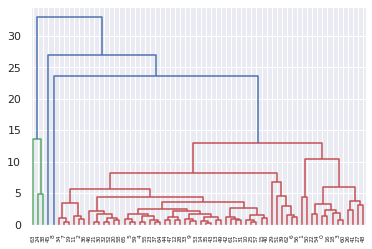

In [ ]:
# Complete Linkage

mergings = linkage(df_pca_final_data, method='complete',metric='euclidean')
dendrogram(mergings)
plt.show()

In [ ]:
df_pca_hc = df_pca_final.copy()
df_pca_hc = df_pca_hc.drop('Cluster_Id5',axis=1)
df_pca_hc.head()

,Location,PC_1,PC_2,PC_3
0,AL,2.4074,0.9151,-0.2216
1,AK,-3.0180,5.4917,0.8974
2,AZ,0.3841,1.0745,-0.5373
3,AR,2.7487,1.8797,-1.6792
4,CA,0.1092,-2.3704,0.1443


In [ ]:
# Let cut the tree at height of approx 3 to get 4 clusters and see if it get any better cluster formation.

clusterCut = pd.Series(cut_tree(mergings, n_clusters = 5).reshape(-1,))
df_hc = pd.concat([df_pca_hc, clusterCut], axis=1)
df_hc.columns = ['Location', 'PC_1', 'PC_2','PC_3','Cluster_Id']

In [ ]:
df_hc['Cluster_Id'].value_counts()

0    61
2    2 
4    1 
3    1 
1    1 
Name: Cluster_Id, dtype: int64

Text(1.5, 1.1, 'Kmeans')

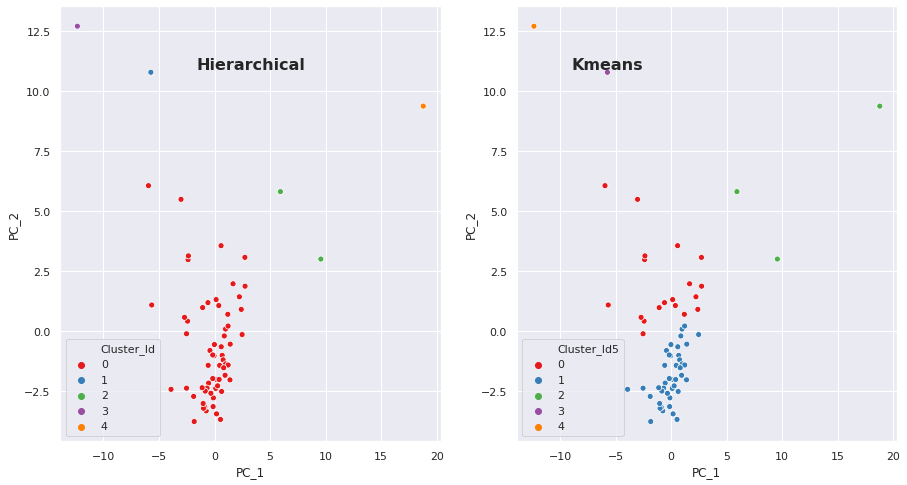

In [ ]:
# Scatter plot on Principal components to visualize the spread of the data

fig, axes = plt.subplots(1,2, figsize=(15,8))

sns.scatterplot(x='PC_1',y='PC_2',hue='Cluster_Id',legend='full',palette="Set1",data=df_hc,ax=axes[0])
axes[0].text(x=0.5, y=1.1, s='Hierarchical', fontsize=16, weight='bold', ha='center', va='bottom', transform=ax.transAxes)
sns.scatterplot(x='PC_1',y='PC_2',hue='Cluster_Id5',legend='full',palette="Set1",data=df_pca_final,ax=axes[1])
axes[1].text(x=1.5, y=1.1, s='Kmeans', fontsize=16, weight='bold', ha='center', va='bottom', transform=ax.transAxes)
# sns.scatterplot(x='PC_1',y='PC_3',hue='Cluster_Id',legend='full',palette="Set1",data=df_hc,ax=axes[1])

In [ ]:
# Silhouette score analysis to find the ideal number of clusters for K-means clustering

range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50,random_state= 100)
    kmeans.fit(df_pca_final_data)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(df_pca_final_data, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

In [ ]:
df_merge_hc = pd.merge(df_locs,df_hc,on='Location')

In [ ]:
df_merge_hc_wopc = df_merge_hc.drop(columns=df_merge_col[92:95])

In [ ]:
df_merge_hc_wopc.head()

,"Food sufficiency for households prior to March 13, 2020_Sometimes not enough to eat ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes",Marital status_Never married ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Respondent currently employed_Yes ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,"Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes",Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,"Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes",Presence of children under 18 years old_No children ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Sex_Male ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,"Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",Marital status_Divorced/separated ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,Marital status_Married ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,"Household income_Less than $25,000 ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes",Education_Less than high school ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,"Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes",Presence of children under 18 years old_Children in household ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,Respondent or household member experienced loss of employment income_Yes ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,"Food sufficiency for households prior to March 13, 2020_Often not enough to eat ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes",Age_55 - 64 ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Presence of children under 18 years old_No children ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes,Computer provided by… *_Some other source ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Education_Bachelor’s degree or higher ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes,"Hispanic origin and Race_White alone, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes",Sex_Male ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes,"Internet provided by… *_Internet, Children’s school or school district ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes",Respondent currently employed_No ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purpose

### Final analysis

In [ ]:
c_0 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==0]
c_1 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==1]
c_2 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==2]
c_3 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==3]
c_4 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==4]

In [ ]:
list(c_4['Location'])

['VT']

In [ ]:
a = list(c_4["Location"])
a_result = []
for elem in a:
  if elem in us_state_abbrev_r.keys():
    a_result.append(us_state_abbrev_r[elem])
  if len(elem)>2:
    a_result.append(elem)

for s in a_result:
  print(s,end=", ")

Vermont, 

In [ ]:
c_2 = df_merge_wopc[df_merge_wopc['Cluster_Id5']==2]

In [ ]:
c_0.describe().loc[:,imp_feat_f_household]

,"Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes","Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes","Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes","Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes","Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes"
count,19.0000,19.0000,19.0000,19.0000,19.0000
mean,0.0971,0.1429,0.2346,0.0096,0.1970
std,0.1183,0.0968,0.0636,0.0086,0.0371
min,0.0000,0.0000,0.1340,0.0000,0.1286
25%,0.0000,0.0806,0.2148,0.0046,0.1782
50%,0.0460,0.1253,0.2261,0.0070,0.1927
75%,0.1499,0.1773,0.2628,0.0123,0.2155
max,0.4216,0.3628,0.3717,0.0330,0.2683


In [ ]:
c_0.describe().loc[:,imp_feat_f_marital]

,Marital status_Never married ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes,Marital status_Widowed ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes,Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes,Marital status_Widowed ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes
count,19.0000,19.0000,19.0000,19.0000
mean,0.0418,0.0829,0.1266,0.1143
std,0.0290,0.1081,0.1654,0.1077
min,0.0000,0.0000,0.0000,0.0000
25%,0.0211,0.0000,0.0000,0.0139
50%,0.0381,0.0000,0.0817,0.1212
75%,0.0585,0.1575,0.1658,0.1711
max,0.0993,0.3298,0.5204,0.4299


In [ ]:
c_1.describe().loc[:,imp_feat_f_household].loc['mean',:]

Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes   0.0097
Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes   0.1319
Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes     0.2292
Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes     0.0054
Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes   0.1843
Name: mean, dtype: float64

In [ ]:
c_0.describe().loc[:,imp_feat_f_household].loc['mean',:]

Household income_$150,000 - $199,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes   0.0971
Household income_$25,000 - $34,999 ##FEATURE## Availability of computer for educational purposes - Device sometimes available for educational purposes   0.1429
Household income_$35,000 - $49,999 ##FEATURE## Availability of computer for educational purposes - Device usually available for educational purposes     0.2346
Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes     0.0096
Household income_$75,000 - $99,999 ##FEATURE## Availability of Internet for educational purposes - Internet usually available for educational purposes   0.1970
Name: mean, dtype: float64

In [ ]:
c_0.describe().loc[:,imp_feat_f_origin].loc['mean',:]

Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes                          0.0843
Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes                         0.0625
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes   0.6483
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes    0.0525
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes   0.0509
Name: mean, dtype: float6

In [ ]:
c_1.describe().loc[:,imp_feat_f_origin].loc['mean',:]

Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device never available for educational purposes                          0.0437
Hispanic origin and Race_Asian alone, not Hispanic ##FEATURE## Availability of computer for educational purposes - Device rarely available for educational purposes                         0.0303
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet always available for educational purposes   0.6840
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet never available for educational purposes    0.0207
Hispanic origin and Race_Two or more races + Other races, not Hispanic ##FEATURE## Availability of Internet for educational purposes - Internet rarely available for educational purposes   0.0269
Name: mean, dtype: float6

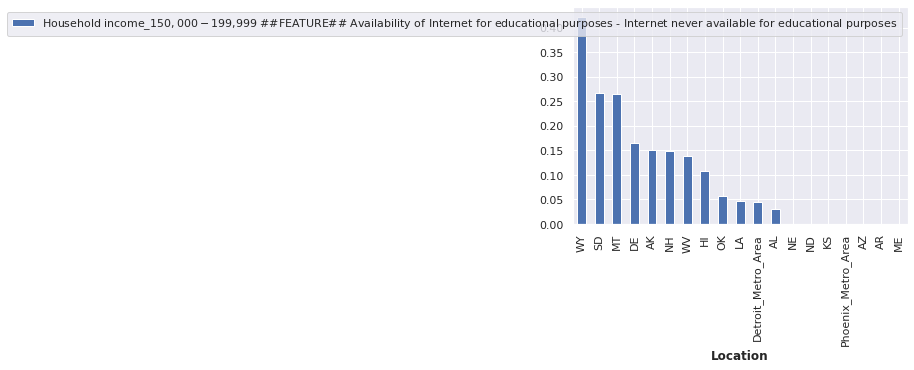

In [ ]:
df_list_c0 = pd.DataFrame(c_0.groupby(['Location'])[imp_feat_f_household[0]].mean().sort_values(ascending = False))
df_list_c0.plot.bar()
# plt.title('Country and Child Mortality')
plt.xlabel("Location",fontweight = 'bold')
plt.ylabel("", fontsize = 12, fontweight = 'bold')
plt.show()

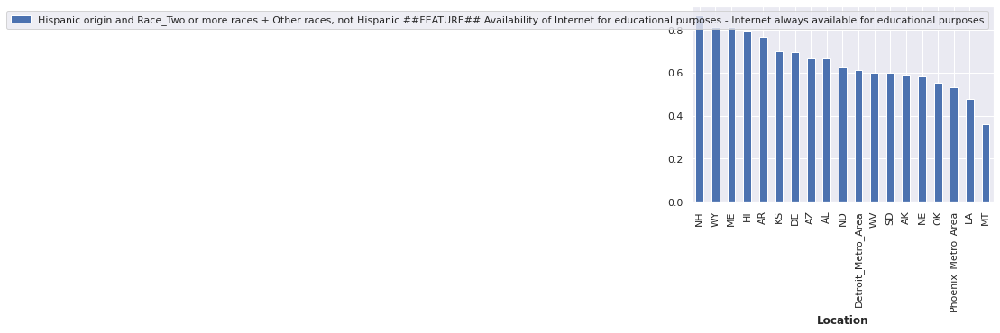

In [ ]:
df_list_c0 = pd.DataFrame(c_0.groupby(['Location'])[imp_feat_f_origin[2]].mean().sort_values(ascending = False))
df_list_c0.plot.bar()
# plt.title('Country and Child Mortality')
plt.xlabel("Location",fontweight = 'bold')
plt.ylabel("", fontsize = 12, fontweight = 'bold')
plt.show()

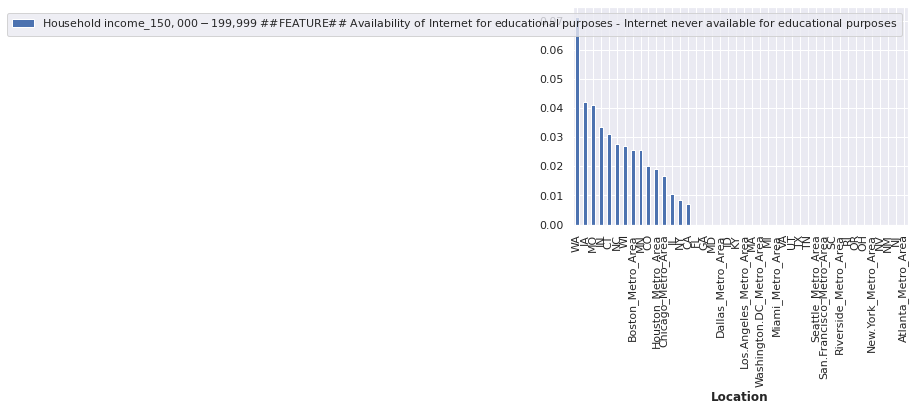

In [ ]:
df_list_c1 = pd.DataFrame(c_1.groupby(['Location'])[imp_feat_f_household[0]].mean().sort_values(ascending = False))
df_list_c1.plot.bar()
# plt.title('Country and Child Mortality')
plt.xlabel("Location",fontweight = 'bold')
plt.ylabel("", fontsize = 12, fontweight = 'bold')
plt.show()

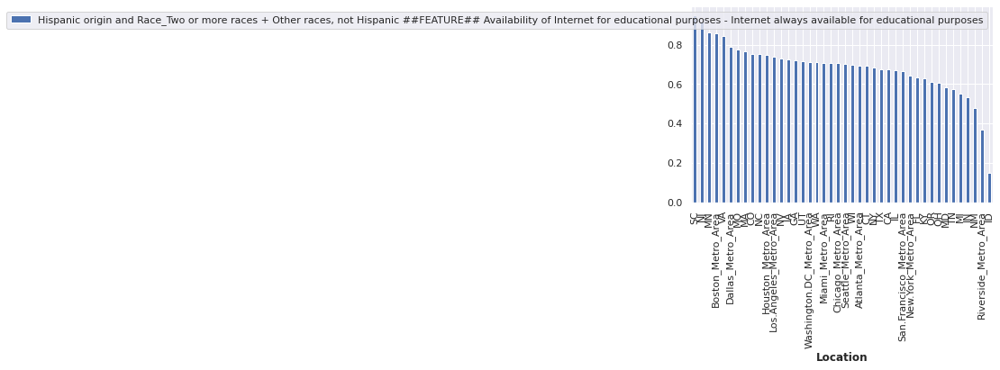

In [ ]:
df_list_c1 = pd.DataFrame(c_1.groupby(['Location'])[imp_feat_f_origin[2]].mean().sort_values(ascending = False))
df_list_c1.plot.bar()
# plt.title('Country and Child Mortality')
plt.xlabel("Location",fontweight = 'bold')
plt.ylabel("", fontsize = 12, fontweight = 'bold')
plt.show()

In [ ]:
a = list(c_0['Location'])

In [ ]:
a

['AL',
 'AK',
 'AZ',
 'AR',
 'DE',
 'HI',
 'KS',
 'LA',
 'ME',
 'MT',
 'NE',
 'NH',
 'ND',
 'OK',
 'SD',
 'WV',
 'WY',
 'Phoenix_Metro_Area',
 'Detroit_Metro_Area']

In [ ]:
b =list(c_1['Location'])

In [ ]:
b

['CA',
 'CO',
 'CT',
 'FL',
 'GA',
 'ID',
 'IL',
 'IN',
 'IA',
 'KY',
 'MD',
 'MA',
 'MI',
 'MN',
 'MO',
 'NV',
 'NJ',
 'NM',
 'NY',
 'NC',
 'OH',
 'OR',
 'RI',
 'SC',
 'TN',
 'TX',
 'UT',
 'VA',
 'WA',
 'WI',
 'Boston_Metro_Area',
 'Atlanta_Metro_Area',
 'Los.Angeles_Metro_Area',
 'New.York_Metro_Area',
 'San.Francisco_Metro_Area',
 'Chicago_Metro_Area',
 'Dallas_Metro_Area',
 'Riverside_Metro_Area',
 'Houston_Metro_Area',
 'Washington.DC_Metro_Area',
 'Seattle_Metro_Area',
 'Miami_Metro_Area']

In [ ]:
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}


In [ ]:
us_state_abbrev_r = {us_state_abbrev[k]:k for k in us_state_abbrev}

In [ ]:
a_result = []
for elem in a:
  if elem in us_state_abbrev_r.keys():
    a_result.append(us_state_abbrev_r[elem])
  if len(elem)>2:
    a_result.append(elem)

In [ ]:
a_result

['Alabama',
 'Alaska',
 'Arizona',
 'Arkansas',
 'Delaware',
 'Hawaii',
 'Kansas',
 'Louisiana',
 'Maine',
 'Montana',
 'Nebraska',
 'New Hampshire',
 'North Dakota',
 'Oklahoma',
 'South Dakota',
 'West Virginia',
 'Wyoming',
 'Phoenix_Metro_Area',
 'Detroit_Metro_Area']

In [ ]:
b_result = []
for elem in b:
  if elem in us_state_abbrev_r.keys():
    b_result.append(us_state_abbrev_r[elem])
  if len(elem)>2:
    b_result.append(elem)

In [ ]:
b_result

['California',
 'Colorado',
 'Connecticut',
 'Florida',
 'Georgia',
 'Idaho',
 'Illinois',
 'Indiana',
 'Iowa',
 'Kentucky',
 'Maryland',
 'Massachusetts',
 'Michigan',
 'Minnesota',
 'Missouri',
 'Nevada',
 'New Jersey',
 'New Mexico',
 'New York',
 'North Carolina',
 'Ohio',
 'Oregon',
 'Rhode Island',
 'South Carolina',
 'Tennessee',
 'Texas',
 'Utah',
 'Virginia',
 'Washington',
 'Wisconsin',
 'Boston_Metro_Area',
 'Atlanta_Metro_Area',
 'Los.Angeles_Metro_Area',
 'New.York_Metro_Area',
 'San.Francisco_Metro_Area',
 'Chicago_Metro_Area',
 'Dallas_Metro_Area',
 'Riverside_Metro_Area',
 'Houston_Metro_Area',
 'Washington.DC_Metro_Area',
 'Seattle_Metro_Area',
 'Miami_Metro_Area']

In [ ]:
  a     b       
va  2/3     4/7
ak  1/3     3/7

va-a- ((2/3)+....)/9